In [2]:
import pymn
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
import anndata as ad
import numpy as np
import itertools
import scipy.stats
import seaborn as sns
import scgen 
sc.settings.verbosity = 3   
sc.set_figure_params(figsize = (15,15),facecolor = 'white')

In [3]:
norm_data = sc.read_h5ad('/data/passala/Collaborator_Data/Bruno_Ken_Collab/Post_review_Dataset/unintegrated_data_fast.h5ad')
cell_identity = pd.read_csv('/data/passala/Collaborator_Data/Bruno_Ken_Collab/Post_review_Dataset/Meta_Maize_Sorghum_Setaria_Nuclei_Cells_SCT_OrthologousgenesGoodname_Sept2022.csv',index_col = 0)
norm_data.obs = cell_identity

In [4]:
norm_data.obs = norm_data.obs.rename(columns = {'orig.ident':'Batch','Annotation':'Cell Cluster Annotation','type':'Type'})

In [5]:
cells_and_set_nuclei_only = norm_data[(norm_data.obs['Type'] == 'Cell')|((norm_data.obs['Type'] == 'Nucl')&(norm_data.obs['Species'] == 'Setaria')),:]


cells_and_set_nuclei_only = cells_and_set_nuclei_only.copy()

In [ ]:
sc.pp.calculate_qc_metrics(norm_data, percent_top=None, log1p=False, inplace=True)

In [8]:
sc.pp.filter_cells(cells_and_set_nuclei_only, min_genes=200)


In [9]:
sc.pp.filter_genes(cells_and_set_nuclei_only, min_cells=3)

filtered out 5020 genes that are detected in less than 3 cells


In [10]:
sc.pp.log1p(cells_and_set_nuclei_only)

In [11]:
sc.pp.highly_variable_genes(cells_and_set_nuclei_only, min_mean=0.0125, max_mean=3, min_disp=0.4, batch_key = 'Batch')

extracting highly variable genes


/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/passala/miniconda3/envs/Single_cell_data_fix/lib/

    finished (0:00:14)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)


In [13]:
cells_and_set_nuclei_only.var['highly_variable_nbatches'].value_counts()

0    39160
1     7419
2     3985
3     2726
4     1001
5      732
6      308
7      179
8      102
9       76
Name: highly_variable_nbatches, dtype: int64

In [14]:
highly_variable_genes_across_batches  = cells_and_set_nuclei_only.var['highly_variable_nbatches']>1
cells_and_set_nuclei_only.var['highly_variable'].loc[highly_variable_genes_across_batches] = True
high_var_list = cells_and_set_nuclei_only.var.loc[highly_variable_genes_across_batches].index.to_list()

/tmp/ipykernel_2213064/4163854764.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cells_and_set_nuclei_only.var['highly_variable'].loc[highly_variable_genes_across_batches] = True


In [16]:
sc.pp.scale(cells_and_set_nuclei_only, max_value=10)

In [17]:
sc.tl.pca(cells_and_set_nuclei_only, svd_solver='arpack')
sc.pp.neighbors(cells_and_set_nuclei_only, n_neighbors=10, n_pcs=40)
sc.tl.umap(cells_and_set_nuclei_only)
sc.tl.leiden(cells_and_set_nuclei_only)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:10)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:13)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:21)
running Leiden clustering
    finished: found 40 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:03)


In [18]:
sc.set_figure_params(figsize = (15,15),facecolor = 'white')

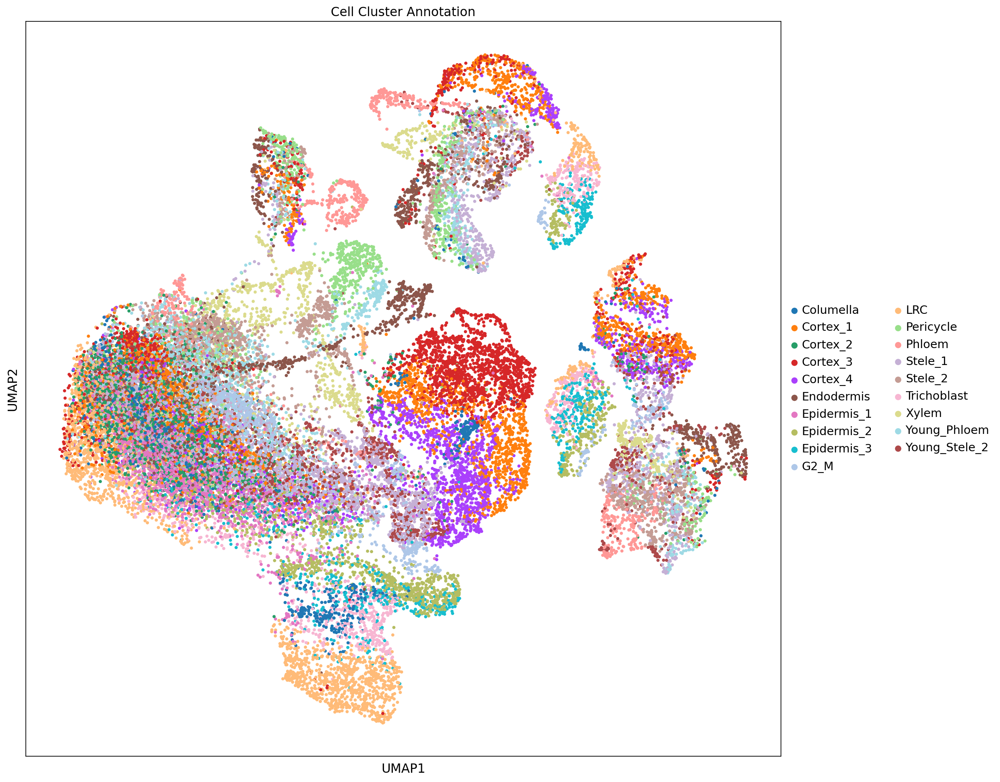

In [19]:
sc.pl.umap(cells_and_set_nuclei_only, color=['Cell Cluster Annotation'], s = 50)

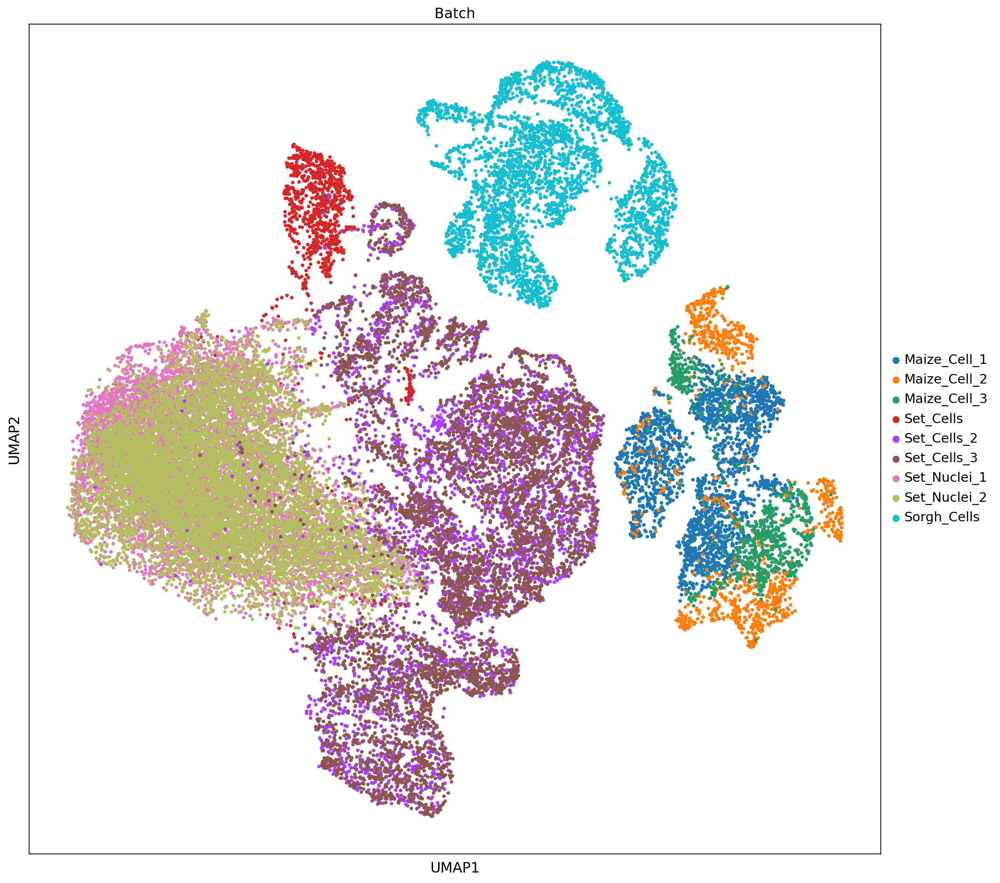

In [20]:
sc.pl.umap(cells_and_set_nuclei_only, color=['Batch'], s = 50)

In [21]:
import scgen
scgen.SCGEN.setup_anndata(cells_and_set_nuclei_only, batch_key="Batch", labels_key="Cell Cluster Annotation")

model2 = scgen.SCGEN(cells_and_set_nuclei_only)
model2.train(
    max_epochs=150,
    batch_size=32,
    early_stopping=True,
    early_stopping_patience=15,
)

/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/scvi/model/base/_training_mixin.py:67: UserWarning: max_epochs=150 is less than n_epochs_kl_warmup=400. The max_kl_weight will not be reached during training.
  warnings.warn(
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 17/150:  11%|█▏        | 17/150 [1:06:56<8:43:39, 236.24s/it, loss=1.04e+04, v_num=1]
Monitored metric elbo_validation did not improve in the last 15 records. Best score: 25326.029. Signaling Trainer to stop.


In [22]:
all_good_cells = model2.batch_removal()
all_good_cells

/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


AnnData object with n_obs × n_vars = 34470 × 55688
    obs: 'Batch', 'nCount_RNA', 'nFeature_RNA', 'nCount_SCT', 'nFeature_SCT', 'integrated_snn_res.0.6', 'seurat_clusters', 'Species', 'Cell Cluster Annotation', 'Type', 'n_genes', 'leiden', '_scvi_batch', '_scvi_labels'
    uns: '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'latent', 'corrected_latent'

In [3]:
#all_good_cells.write('/data/passala/Generated_Tables/Temp_junk/integrate_cells_and_set_nuclei_only.h5ad')
all_good_cells = sc.read_h5ad('/data/passala/Generated_Tables/Temp_junk/integrate_cells_and_set_nuclei_only.h5ad')

In [4]:
sc.pp.neighbors(all_good_cells)
sc.tl.umap(all_good_cells)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:15)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:24)


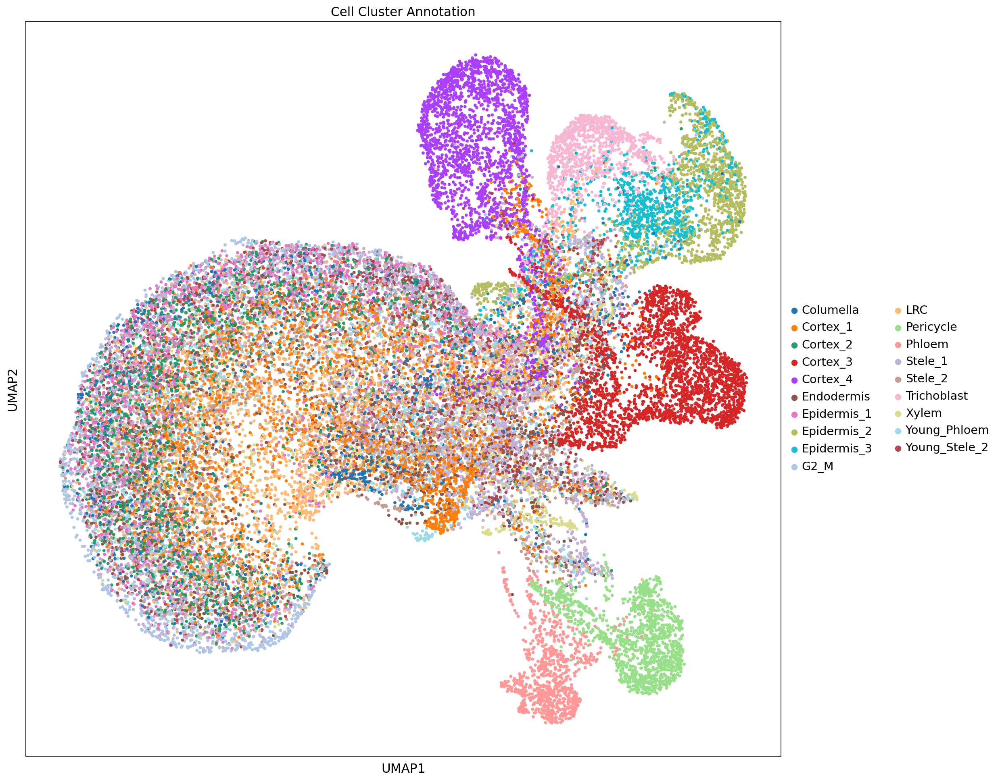

In [5]:
sc.pl.umap(all_good_cells, color=['Cell Cluster Annotation'], s = 50)

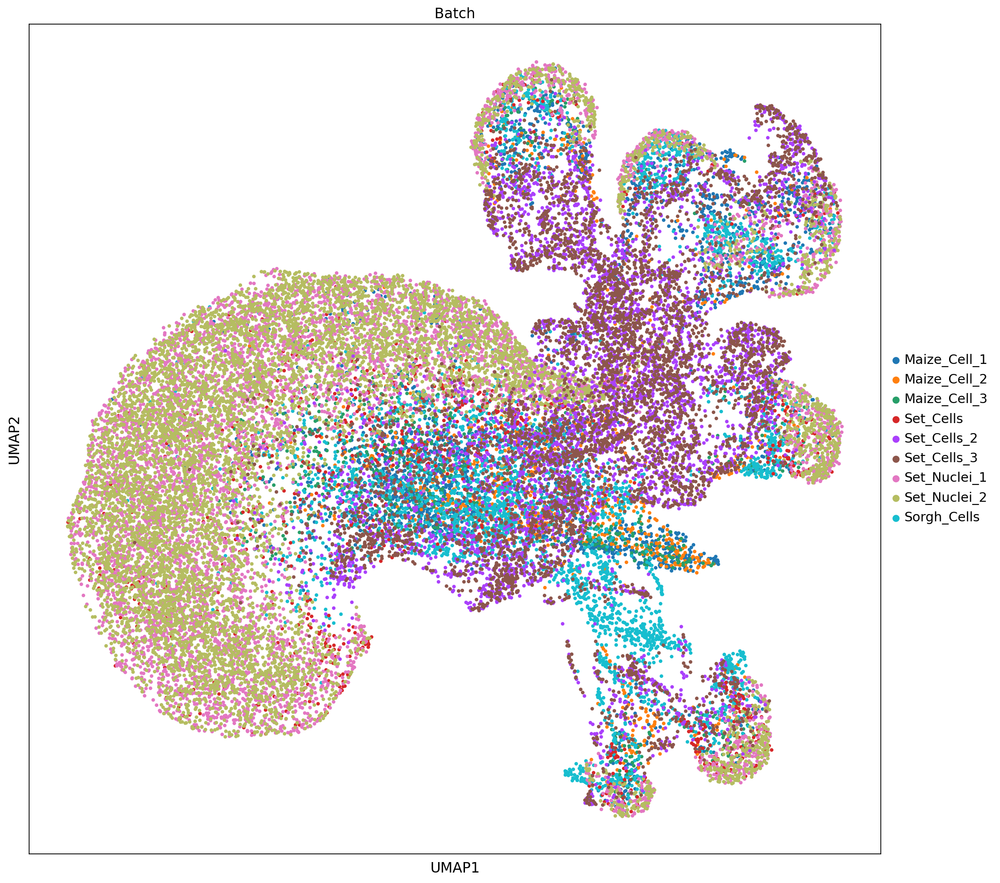

In [6]:
sc.pl.umap(all_good_cells, color=['Batch'], s = 50)

/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/seaborn/matrix.py:1214: UserWarning: ``square=True`` ignored in clustermap
  warnings.warn(msg)


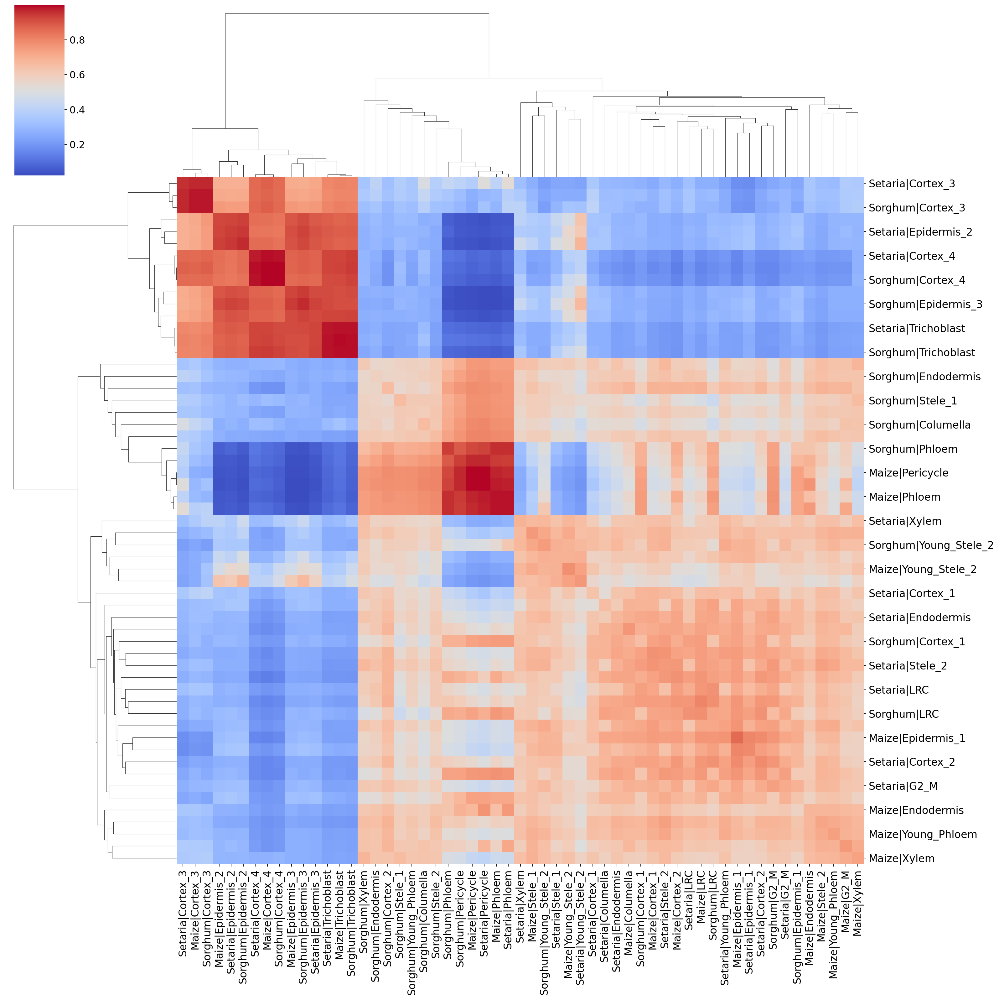

In [7]:
pymn.variableGenes(all_good_cells,study_col = 'Species')
pymn.MetaNeighborUS(all_good_cells,study_col = 'Species',ct_col = 'Cell Cluster Annotation', compute_p= True)
g = pymn.plotMetaNeighborUS(all_good_cells,figsize = (20,20),fontsize = 15,show = False,cbar_pos = (0.02,0.82,0.05,0.17), cmap = 'coolwarm')